In [1]:
import pandas as pd
from textblob import TextBlob
import seaborn as sns
import matplotlib.pyplot as plt
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
import spacy
from sklearn.feature_extraction.text import CountVectorizer
from gensim import corpora
from gensim.models import LdaModel
from wordcloud import WordCloud
from bertopic import BERTopic
import nltk
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
import plotly.graph_objects as go
from scipy.signal import find_peaks
from sklearn.decomposition import PCA
df = pd.read_csv("youtube_comments.csv")
df.head()

C:\Users\serca\anaconda3\envs\youtube-analyzer\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


,Author,Published At,Comment
0,@JV-df9em,2025-04-16T23:04:04Z,I’m unfamiliar with Devon or that sport - is h...
1,@jespermeisel9799,2025-04-16T22:36:34Z,Armwrestling is no joke. I hurt my arm really ...
2,@zackdaripr,2025-04-16T22:34:02Z,Devon rocks.
3,@billtodd6567,2025-04-16T22:32:15Z,what a gentleman devon...wish more people were...
4,@EasyEk5,2025-04-16T22:22:54Z,Devon seems like a hell of a guy


In [2]:
df = df.dropna(subset=['Comment'])

In [3]:
def get_sentiment(text):
    blob = TextBlob(str(text))
    polarity = blob.sentiment.polarity
    if polarity > 0:
        return 'positive'
    elif polarity < 0:
        return 'negative'
    else:
        return 'neutral'
# Rename the sentiment column as "TextBlob_Sentiment"
df['TextBlob_Sentiment'] = df['Comment'].apply(get_sentiment)

# Display the first 10 results
df[['Comment', 'TextBlob_Sentiment']].head(10)

,Comment,TextBlob_Sentiment
0,I’m unfamiliar with Devon or that sport - is h...,negative
1,Armwrestling is no joke. I hurt my arm really ...,positive
2,Devon rocks.,neutral
3,what a gentleman devon...wish more people were...,positive
4,Devon seems like a hell of a guy,neutral
5,The functional changes to his arms are amazing...,positive
6,"It's unbelievable how such a strong guy, with ...",positive
7,"hes not the strongest, levan is.",neutral
8,Il migliore al momento e levan,neutral
9,"why does he stand like a chimp, like his arms ...",neutral


In [4]:
df

,Author,Published At,Comment,TextBlob_Sentiment
0,@JV-df9em,2025-04-16T23:04:04Z,I’m unfamiliar with Devon or that sport - is h...,negative
1,@jespermeisel9799,2025-04-16T22:36:34Z,Armwrestling is no joke. I hurt my arm really ...,positive
2,@zackdaripr,2025-04-16T22:34:02Z,Devon rocks.,neutral
3,@billtodd6567,2025-04-16T22:32:15Z,what a gentleman devon...wish more people were...,positive
4,@EasyEk5,2025-04-16T22:22:54Z,Devon seems like a hell of a guy,neutral
...,...,...,...,...
1962,@jessemoore2346,2025-04-13T15:48:49Z,Yaaaaay new video,positive
1963,@40.4,2025-04-13T15:48:47Z,New video with Devon! :D,positive
1964,@tiberiuilie3456,2025-04-13T15:48:40Z,"First, also your the reason I started rock-cli...",positive
1965,@andycortez6119,2025-04-13T15:48:39Z,First,positive


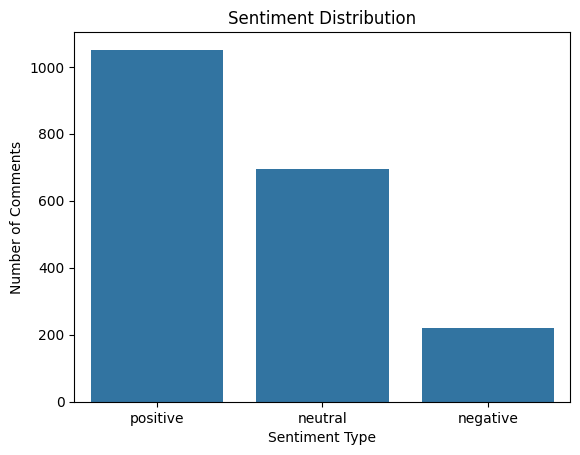

In [5]:
sns.countplot(data=df, x='TextBlob_Sentiment', order=['positive', 'neutral', 'negative'])
plt.title("Sentiment Distribution")
plt.xlabel("Sentiment Type")
plt.ylabel("Number of Comments")
plt.show()

In [6]:
# VADER sentiment analysis tool
analyzer = SentimentIntensityAnalyzer()

# VADER sentiment analysis function
def vader_sentiment(text):
    score = analyzer.polarity_scores(str(text))['compound']
    if score >= 0.05:
        return 'positive'
    elif score <= -0.05:
        return 'negative'
    else:
        return 'neutral'

# Apply sentiment analysis
df['VADER_Sentiment'] = df['Comment'].apply(vader_sentiment)

# Display the first 10 results
df[['Comment', 'VADER_Sentiment']].head(10)


,Comment,VADER_Sentiment
0,I’m unfamiliar with Devon or that sport - is h...,neutral
1,Armwrestling is no joke. I hurt my arm really ...,positive
2,Devon rocks.,neutral
3,what a gentleman devon...wish more people were...,positive
4,Devon seems like a hell of a guy,negative
5,The functional changes to his arms are amazing...,positive
6,"It's unbelievable how such a strong guy, with ...",positive
7,"hes not the strongest, levan is.",negative
8,Il migliore al momento e levan,neutral
9,"why does he stand like a chimp, like his arms ...",positive


In [7]:
df

,Author,Published At,Comment,TextBlob_Sentiment,VADER_Sentiment
0,@JV-df9em,2025-04-16T23:04:04Z,I’m unfamiliar with Devon or that sport - is h...,negative,neutral
1,@jespermeisel9799,2025-04-16T22:36:34Z,Armwrestling is no joke. I hurt my arm really ...,positive,positive
2,@zackdaripr,2025-04-16T22:34:02Z,Devon rocks.,neutral,neutral
3,@billtodd6567,2025-04-16T22:32:15Z,what a gentleman devon...wish more people were...,positive,positive
4,@EasyEk5,2025-04-16T22:22:54Z,Devon seems like a hell of a guy,neutral,negative
...,...,...,...,...,...
1962,@jessemoore2346,2025-04-13T15:48:49Z,Yaaaaay new video,positive,neutral
1963,@40.4,2025-04-13T15:48:47Z,New video with Devon! :D,positive,positive
1964,@tiberiuilie3456,2025-04-13T15:48:40Z,"First, also your the reason I started rock-cli...",positive,positive
1965,@andycortez6119,2025-04-13T15:48:39Z,First,positive,neutral


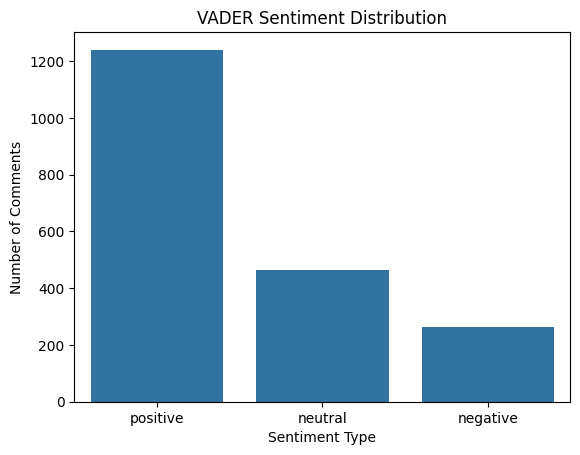

In [8]:
# VADER sentiment distribution visualization
sns.countplot(data=df, x='VADER_Sentiment', order=['positive', 'neutral', 'negative'])
plt.title("VADER Sentiment Distribution")
plt.xlabel("Sentiment Type")
plt.ylabel("Number of Comments")
plt.show()

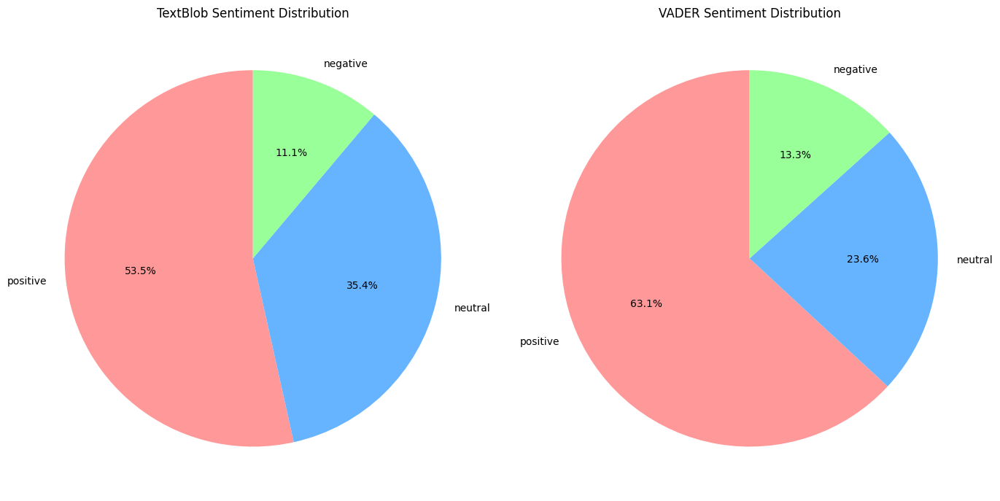

In [9]:
# Pie charts for sentiment distribution
# Calculate sentiment distribution using both TextBlob and VADER
textblob_counts = df['TextBlob_Sentiment'].value_counts()
vader_counts = df['VADER_Sentiment'].value_counts()

# Set figure dimensions for plots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 7))

# Pie chart for TextBlob sentiment distribution
ax1.pie(textblob_counts, labels=textblob_counts.index, autopct='%1.1f%%', startangle=90, colors=['#FF9999','#66B3FF','#99FF99'])
ax1.set_title("TextBlob Sentiment Distribution")

# Pie chart for VADER sentiment distribution
ax2.pie(vader_counts, labels=vader_counts.index, autopct='%1.1f%%', startangle=90, colors=['#FF9999','#66B3FF','#99FF99'])
ax2.set_title("VADER Sentiment Distribution")

# Display sentiment charts
plt.tight_layout()
plt.show()

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\serca\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


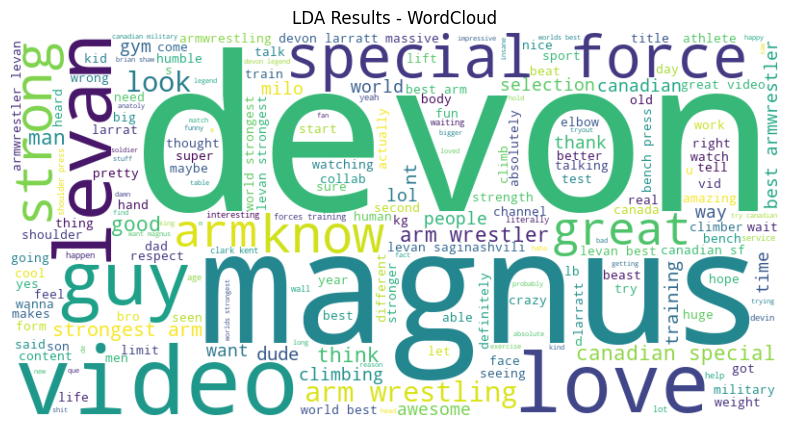

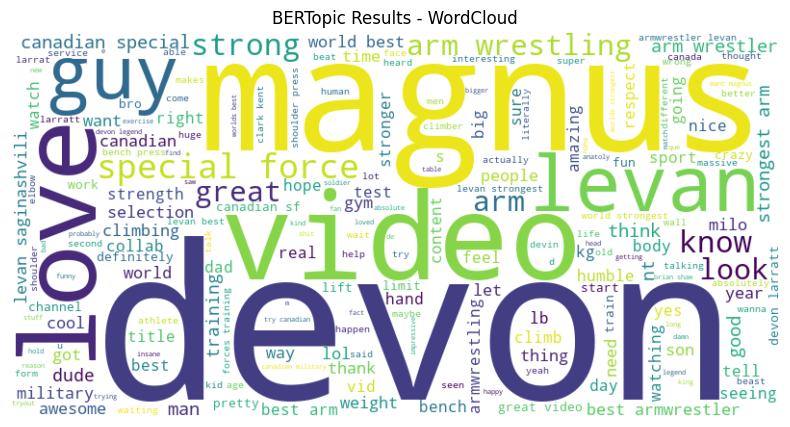

In [10]:
nltk.download('punkt')

# Load SpaCy language model
nlp = spacy.load("en_core_web_sm")

# Tokenize and clean comments using SpaCy
def preprocess(text):
    if isinstance(text, str):
        doc = nlp(text.lower())  # Convert to lowercase
        return [token.text for token in doc if not token.is_stop and token.is_alpha]  # Remove stopwords and special characters
    else:
        return []

# Load the dataset and drop NaN values
df = pd.read_csv("youtube_comments.csv")
df = df.dropna(subset=['Comment'])

# Text preprocessing using SpaCy
df['Processed_Comments'] = df['Comment'].apply(preprocess)

# Build the LDA model
# Create dictionary and corpus for LDA
dictionary = corpora.Dictionary(df['Processed_Comments'])
corpus = [dictionary.doc2bow(comment) for comment in df['Processed_Comments']]

# Train LDA topic model
lda_model = LdaModel(corpus=corpus, num_topics=3, id2word=dictionary, passes=15)

# Assign predicted topic to each comment from LDA
lda_topic_assignments = [max(lda_model[comment], key=lambda x: x[1])[0] if lda_model[comment] else -1 for comment in corpus]
df['LDA_Topic'] = lda_topic_assignments

# Train BERTopic model
topic_model = BERTopic()
topics, _ = topic_model.fit_transform(df['Processed_Comments'].apply(lambda x: ' '.join(x)))

# Add BERTopic results to the DataFrame
df['BerTopic_Topic'] = topics

# Visualize LDA topic model using WordCloud
all_words_lda = ' '.join([word for comment in df['Processed_Comments'] for word in comment])
wordcloud_lda = WordCloud(width=800, height=400, background_color='white').generate(all_words_lda)

# Visualize BERTopic topic model using WordCloud
all_words_bertopic = ' '.join([word for comment in df['Processed_Comments'] for word in comment])
wordcloud_bertopic = WordCloud(width=800, height=400, background_color='white').generate(all_words_bertopic)

# Display topic model visualizations
# LDA WordCloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud_lda, interpolation='bilinear')
plt.axis('off')
plt.title("LDA Results - WordCloud")
plt.show()

# BERTopic WordCloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud_bertopic, interpolation='bilinear')
plt.axis('off')
plt.title("BERTopic Results - WordCloud")
plt.show()


In [11]:
df

,Author,Published At,Comment,Processed_Comments,LDA_Topic,BerTopic_Topic
0,@JV-df9em,2025-04-16T23:04:04Z,I’m unfamiliar with Devon or that sport - is h...,"[unfamiliar, devon, sport, unable, straighten,...",2,5
1,@jespermeisel9799,2025-04-16T22:36:34Z,Armwrestling is no joke. I hurt my arm really ...,"[armwrestling, joke, hurt, arm, bad, took, wee...",1,9
2,@zackdaripr,2025-04-16T22:34:02Z,Devon rocks.,"[devon, rocks]",2,1
3,@billtodd6567,2025-04-16T22:32:15Z,what a gentleman devon...wish more people were...,"[gentleman, devon, wish, people, like]",2,1
4,@EasyEk5,2025-04-16T22:22:54Z,Devon seems like a hell of a guy,"[devon, like, hell, guy]",2,1
...,...,...,...,...,...,...
1962,@jessemoore2346,2025-04-13T15:48:49Z,Yaaaaay new video,"[yaaaaay, new, video]",1,3
1963,@40.4,2025-04-13T15:48:47Z,New video with Devon! :D,"[new, video, devon, d]",1,33
1964,@tiberiuilie3456,2025-04-13T15:48:40Z,"First, also your the reason I started rock-cli...","[reason, started, rock, climbing, changed, fil...",0,2
1965,@andycortez6119,2025-04-13T15:48:39Z,First,[],0,14


In [12]:
# Convert comments to lowercase
comments = df['Comment'].apply(lambda x: x.lower()).tolist()

# Vectorize using TF-IDF
vectorizer = TfidfVectorizer(stop_words='english')
X = vectorizer.fit_transform(comments)

# K-Means clustering (example with 3 clusters)
kmeans = KMeans(n_clusters=3, random_state=42)
clusters = kmeans.fit_predict(X)

# Add cluster labels to original DataFrame
df['Cluster'] = clusters

# Display clustering results
print(df[['Comment', 'Cluster']])




  File "C:\Users\serca\anaconda3\envs\youtube-analyzer\Lib\site-packages\joblib\externals\loky\backend\context.py", line 257, in _count_physical_cores
    cpu_info = subprocess.run(
               ^^^^^^^^^^^^^^^
  File "C:\Users\serca\anaconda3\envs\youtube-analyzer\Lib\subprocess.py", line 550, in run
    with Popen(*popenargs, **kwargs) as process:
         ^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\serca\anaconda3\envs\youtube-analyzer\Lib\subprocess.py", line 1028, in __init__
    self._execute_child(args, executable, preexec_fn, close_fds,
  File "C:\Users\serca\anaconda3\envs\youtube-analyzer\Lib\subprocess.py", line 1540, in _execute_child
    hp, ht, pid, tid = _winapi.CreateProcess(executable, args,
                       ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^


                                                Comment  Cluster
0     I’m unfamiliar with Devon or that sport - is h...        0
1     Armwrestling is no joke. I hurt my arm really ...        1
2                                          Devon rocks.        0
3     what a gentleman devon...wish more people were...        0
4                      Devon seems like a hell of a guy        0
...                                                 ...      ...
1962                                  Yaaaaay new video        1
1963                           New video with Devon! :D        0
1964  First, also your the reason I started rock-cli...        1
1965                                              First        1
1966                                                  ❤        1

[1965 rows x 2 columns]


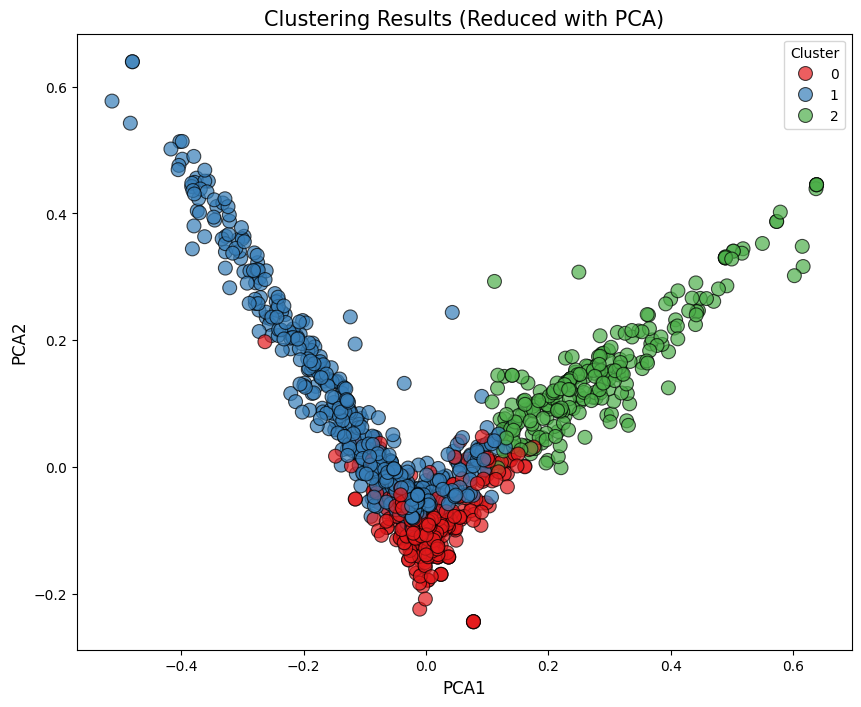

In [13]:
# Apply PCA to reduce dimensions for clustering visualization
pca = PCA(n_components=2)
pca_components = pca.fit_transform(X.toarray())

# Add PCA components to DataFrame
df['PCA1'] = pca_components[:, 0]
df['PCA2'] = pca_components[:, 1]

# Visualize clusters in 2D with color coding
plt.figure(figsize=(10, 8))
sns.scatterplot(x='PCA1', y='PCA2', hue='Cluster', palette='Set1', data=df, s=100, edgecolor='k', alpha=0.7)

# Add plot title and axis labels
plt.title('Clustering Results (Reduced with PCA)', fontsize=15)
plt.xlabel('PCA1', fontsize=12)
plt.ylabel('PCA2', fontsize=12)
plt.legend(title='Cluster', loc='best')
plt.show()

In [15]:
# Convert 'Published At' column to datetime format
df['Published At'] = pd.to_datetime(df['Published At'])

# Find first and last comment dates
first_comment_date = df['Published At'].min()
last_comment_date = df['Published At'].max()

# Generate all dates between first and last
date_range = pd.date_range(start=first_comment_date, end=last_comment_date, freq='D')

# Group comment counts by date
daily_comments = df.groupby(df['Published At'].dt.date).size()

# Fill missing dates with zero comments
daily_comments = daily_comments.reindex(date_range.date, fill_value=0)

# Plot comment count trend (e.g., 3-day moving average)
z = daily_comments.rolling(window=3, min_periods=1).mean()  # Using min_periods=1 to ensure early NaN values are filled in the moving average calculation

# Detect peak activity days (significant increases in comment count)
peaks, _ = find_peaks(daily_comments.values, distance=2)

# Create interactive plot
fig = go.Figure()

# Line chart of daily comment count
fig.add_trace(go.Scatter(x=daily_comments.index, y=daily_comments.values,
                         mode='lines+markers', name='Comment Count',
                         line=dict(color='blue'), marker=dict(symbol='circle', size=6)))

# Trend line showing 3-day moving average
fig.add_trace(go.Scatter(x=daily_comments.index, y=z,
                         mode='lines', name='Trend (3-Day Average)',
                         line=dict(color='red', dash='dash')))

# Highlight peak points
fig.add_trace(go.Scatter(x=daily_comments.index[peaks], y=daily_comments.values[peaks],
                         mode='markers', name='Peak Points',
                         marker=dict(color='green', size=10, symbol='star', line=dict(width=2))))

# Set plot title and axis labels
fig.update_layout(title="Distribution and Trend of Comment Count Over Time",
                  xaxis_title="Date",
                  yaxis_title="Number of Comments",
                  template="plotly_white",
                  xaxis_tickformat="%Y-%m-%d",  # Format date axis for better readability
                  hovermode="closest")

# Display the time series plot
fig.show()

